In [1]:
import csv

import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
from pandas import *
import seaborn as sns
from matplotlib import rcParams
import datetime as dt

import os
import glob

import timeit

In [435]:
df = pd.read_csv('C:/Users/a.guidi/Desktop/side_project/austin_ride/RideAustin_Weather.csv')

In [436]:
df.head()

,completed_on,distance_travelled,end_location_lat,end_location_long,started_on,driver_rating,charity_id,requested_car_category,free_credit_used,surge_factor,...,model,year,PRCP,TMAX,TMIN,AWND,GustSpeed2,Fog,HeavyFog,Thunder
0,6/4/16 4:35,285.0,30.27,-97.75,6/4/16 4:34,5.0,NaN,REGULAR,NaN,0.0,...,XTS,2013,0.1,86,67,4.9,13.0,1,0,0
1,6/4/16 4:51,1029.0,30.27,-97.74,6/4/16 4:45,5.0,NaN,REGULAR,NaN,0.0,...,XTS,2013,0.1,86,67,4.9,13.0,1,0,0
2,6/4/16 5:27,8459.0,38.68,-121.04,6/4/16 5:18,5.0,NaN,REGULAR,NaN,0.0,...,Continental GT,2013,0.1,86,67,4.9,13.0,1,0,0
3,6/4/16 6:51,443.0,38.68,-121.04,6/4/16 6:50,5.0,NaN,REGULAR,NaN,0.0,...,Continental GT,2013,0.1,86,67,4.9,13.0,1,0,0
4,6/4/16 8:17,568.0,38.68,-121.04,6/4/16 8:16,3.0,NaN,REGULAR,NaN,0.0,...,Continental GT,2013,0.1,86,67,4.9,13.0,1,0,0


In [437]:
for col in df.columns:
    print(col)

completed_on
distance_travelled
end_location_lat
end_location_long
started_on
driver_rating
charity_id
requested_car_category
free_credit_used
surge_factor
start_location_long
start_location_lat
color
make
model
year
PRCP
TMAX
TMIN
AWND
GustSpeed2
Fog
HeavyFog
Thunder


In [438]:
df.shape

(911057, 24)

# Some Data Cleaning

In [439]:
df = df.dropna(subset=["driver_rating"])

In [440]:
df.shape

(804894, 24)

In [441]:
df = df.fillna(0)

### provide an initial exploratory analysis on the ​success of  drivers​ based on other factors recorded by ridesharing services.  

#### a. What trends / patterns do you see?
##### - vast majority of people give 5 stars, so even 4 can be considered "bad". Following June 2016 there was a seady, consistent decline in ratings, but it seems to be on the rise again since a trough in October 2016.

#### b. Are there any actionable items to help ridesharing companies increase  their rate of success?
##### - Further investigate why there was a dip in ratings in October- perhaps the company was experimenting with new pricing or changes to service that negatively effected customer experience, or perhaps there was a glitch in the app or several unpopular drivers that were especially active, or a lack of drivers, availability. All these things should be investigated and avoided
##### - carefully consider pros and cons of surge pricing- Obviously there is the benefit of regulating supply and demand and bringing in more revenue, but the ratings do dip, so one would have to do a cost-benefit analysis or not let those users give 'real' ratings to their drivers.
##### - collect more data (see below), hire great drivers (can see if driver experience, gender positively impacts success criteria such as # rides taken and rating), incentivize drivers with great ratings to stay with the company, rest to be determined by findings

#### c. Are there any other data points that you would recommend adding to this  dataset to provide more relevant details?
##### - music y or n, waiting time, pickup latlong, some driver information such as years of experience driving prior to hire at AustinRides

#### d. How would you visualize the most telling pieces of information from this  dataset?

#### e. Please provide examples of visualizations that help support your  analysis.

In [442]:
df['completed_on'] = to_datetime(df['completed_on'])

In [443]:
df['started_on'] = to_datetime(df['started_on'])

In [27]:
import geojson

In [28]:
import json
import re

In [30]:
import os
import glob

In [32]:
import matplotlib.pyplot as plt
from pandas import *
import seaborn as sns
from matplotlib import rcParams
import datetime as dt

In [33]:
import csv

## next steps would be a choropleth map with rating per Austin neighborhood (incomplete)

In [42]:
with open('C:/Users/a.guidi/Desktop/side_project/austin_ride/neighbourhoods.geojson') as f:
    gj = geojson.load(f)

In [ ]:
from shapely.geometry import Point, Polygon

In [ ]:
features = gj['features'][0]

In [44]:
features["geometry"]["coordinates"]

[[[[-97.890016, 30.209412],
   [-97.889286, 30.208708],
   [-97.888672, 30.207904],
   [-97.88822, 30.207299],
   [-97.88752, 30.206345],
   [-97.886872, 30.205469],
   [-97.886517, 30.205022],
   [-97.886029, 30.204487],
   [-97.88542, 30.203912],
   [-97.884924, 30.203498],
   [-97.884474, 30.203157],
   [-97.884007, 30.202848],
   [-97.883473, 30.202527],
   [-97.88299, 30.202254],
   [-97.882506, 30.202013],
   [-97.881903, 30.201707],
   [-97.881386, 30.201494],
   [-97.880723, 30.201256],
   [-97.879919, 30.200993],
   [-97.879385, 30.200851],
   [-97.878781, 30.200713],
   [-97.878058, 30.200553],
   [-97.877606, 30.200478],
   [-97.876957, 30.200411],
   [-97.876312, 30.200365],
   [-97.87568, 30.200342],
   [-97.875091, 30.200326],
   [-97.874472, 30.200349],
   [-97.873762, 30.200394],
   [-97.873041, 30.200473],
   [-97.872354, 30.200575],
   [-97.871806, 30.200691],
   [-97.871298, 30.200814],
   [-97.870575, 30.200965],
   [-97.870402, 30.201],
   [-97.870068, 30.201057],


In [48]:
features["properties"]["neighbourhood"]

'78739'

In [526]:
#for x in 

In [525]:
# m = folium.Map(location=[37, -102], zoom_start=5)
 
# # Add the color for the chloropleth:
# m.choropleth(
#  geo_data=gj,
#  name='choropleth',
#  data=df,
#  columns=['neighbourhood', 'driver_rating'],
#  key_on='features',
#  fill_color='YlGn',
#  fill_opacity=0.7,
#  line_opacity=0.2,
#  legend_name='driver_rating'
# )
# folium.LayerControl().add_to(m)


# Preliminary Analysis

In [49]:
%matplotlib inline

In [66]:
!pip install plotly

  Created wheel for retrying: filename=retrying-1.3.3-cp37-none-any.whl size=11435 sha256=78d7f4cc276531b6ff2a79e72869cb940e4774b30324e6eb0eb9479a035fa2b2
  Stored in directory: C:\Users\a.guidi\AppData\Local\pip\Cache\wheels\d7\a9\33\acc7b709e2a35caa7d4cae442f6fe6fbf2c43f80823d46460c
Successfully built retrying


You should consider upgrading via the 'python -m pip install --upgrade pip' command.


In [67]:
import plotly.express as px

In [444]:
fig = px.histogram(df['driver_rating'], x="driver_rating")
fig.show()

In [445]:
df['driver_rating'].value_counts()

5.0    726549
4.0     43964
3.0     15985
1.0     13543
2.0      4797
0.0        45
4.5        10
0.5         1
Name: driver_rating, dtype: int64

In [446]:
import seaborn as sns
sns.set(style="whitegrid")

In [447]:
b= df.groupby(pd.to_datetime(df['started_on']).dt.to_period('M'))

In [448]:
driver_rating_over_time2 = b.aggregate({"driver_rating":np.mean}).reset_index()

In [449]:
driver_rating_over_time2

,started_on,driver_rating
0,2016-06,4.868401
1,2016-07,4.852483
2,2016-08,4.821872
3,2016-09,4.821433
4,2016-10,4.809514
5,2016-11,4.828947
6,2016-12,4.823569
7,2017-01,4.815789
8,2017-02,4.826757


In [488]:

import plotly.graph_objs as go

In [489]:
fig = px.line(x=  driver_rating_over_time2['started_on'].astype(str), y= driver_rating_over_time2['driver_rating'],
              labels={'x':'time', 'y':'driver_rating'})

In [490]:
fig.show()

In [491]:
day = df.groupby(pd.to_datetime(df['started_on']).dt.weekday_name)

In [493]:
driver_rating_over_time2 = day.aggregate({"driver_rating":np.mean}).reset_index()

In [494]:
driver_rating_over_time2

,started_on,driver_rating
0,Friday,4.831915
1,Monday,4.831205
2,Saturday,4.812801
3,Sunday,4.801372
4,Thursday,4.836053
5,Tuesday,4.833354
6,Wednesday,4.829009


In [495]:
fig = px.scatter(x=  driver_rating_over_time2['started_on'].astype(str), y= driver_rating_over_time2['driver_rating'],
              labels={'x':'Day of Week', 'y':'driver_rating'})

In [496]:
fig.update_traces(marker=dict(size=30,
                              line=dict(width=2,
                                        color='DarkSlateGrey')),
                  selector=dict(mode='markers'))

# Continuous Data vs. Driver Rating

### Liner Regression trial to view Beta coefficients, some more normalization would be necessary for this to be more effective

In [140]:
from sklearn.linear_model import LinearRegression
from sklearn import metrics

In [497]:
df= df.dropna(subset=['distance_travelled'])

In [498]:
type(df['distance_travelled'][0])

numpy.float64

In [499]:
X = df[['TMIN', 'TMAX', 'AWND', 'GustSpeed2', 'PRCP', 'distance_travelled', 'free_credit_used']].values
y = df['driver_rating'].values

In [500]:
regressor = LinearRegression()  
regressor.fit(X, y)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None,
         normalize=False)

In [501]:
X

array([[6.7000e+01, 8.6000e+01, 4.9000e+00, ..., 1.0000e-01, 2.8500e+02,
        0.0000e+00],
       [6.7000e+01, 8.6000e+01, 4.9000e+00, ..., 1.0000e-01, 1.0290e+03,
        0.0000e+00],
       [6.7000e+01, 8.6000e+01, 4.9000e+00, ..., 1.0000e-01, 8.4590e+03,
        0.0000e+00],
       ...,
       [5.6000e+01, 8.6000e+01, 2.2000e+00, ..., 0.0000e+00, 1.0186e+04,
        1.2610e+01],
       [5.6000e+01, 8.6000e+01, 2.2000e+00, ..., 0.0000e+00, 3.1670e+03,
        0.0000e+00],
       [5.6000e+01, 8.6000e+01, 2.2000e+00, ..., 0.0000e+00, 1.6987e+04,
        0.0000e+00]])

In [502]:
regressor.coef_

array([ 1.64263043e-04, -2.06194574e-04,  5.60074148e-04,  4.21826521e-04,
        3.18665590e-03, -5.77119881e-08, -3.42436583e-04])

In [503]:
from scipy.stats import spearmanr

In [504]:
coef, p = spearmanr(df['driver_rating']/5, df['PRCP'])
print('Spearmans correlation coefficient: %.3f' % coef)

Spearmans correlation coefficient: 0.001


In [505]:
p

0.20306044798904654

In [506]:
alpha = .05
if p > alpha:
    print('Samples are uncorrelated (fail to reject H0) p=%.3f' % p)
else:
    print('Samples are correlated (reject H0) p=%.3f' % p)

Samples are uncorrelated (fail to reject H0) p=0.203


In [508]:
for x in ['PRCP','TMAX','TMIN','AWND','GustSpeed2','make','free_credit_used','distance_travelled']:
    coef, p = spearmanr(df['driver_rating']/5, df[x])
#     print(x + ': Spearmans correlation coefficient: %.3f' % coef)
    alpha = .05
    if p > alpha:
        print(x + ': Samples are uncorrelated (fail to reject H0) p=%.3f' % p)
    else:
        print(x + ': Samples are correlated (reject H0) p=%.3f' % p)

PRCP: Samples are uncorrelated (fail to reject H0) p=0.203
TMAX: Samples are correlated (reject H0) p=0.003
TMIN: Samples are correlated (reject H0) p=0.010
AWND: Samples are correlated (reject H0) p=0.000
GustSpeed2: Samples are correlated (reject H0) p=0.001
make: Samples are correlated (reject H0) p=0.000
free_credit_used: Samples are correlated (reject H0) p=0.000
distance_travelled: Samples are uncorrelated (fail to reject H0) p=0.642


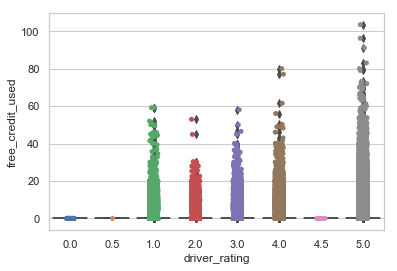

In [514]:
ax = sns.stripplot(x=df['driver_rating'], y=df['free_credit_used'], data=df, size=5.0, jitter=True)
ax = sns.boxplot(x=df['driver_rating'], y=df['free_credit_used'], data=df, whis=np.inf)

In [513]:
fig = ax.get_figure()
fig.savefig("free_credit_used.png")

# categorical Data - stacked bar chart

In [515]:
df_test = df.groupby(['requested_car_category','driver_rating']).size().reset_index()

In [516]:
df_test

,requested_car_category,driver_rating,0
0,HONDA,1.0,9
1,HONDA,2.0,5
2,HONDA,3.0,4
3,HONDA,4.0,23
4,HONDA,5.0,1314
5,LUXURY,1.0,72
6,LUXURY,2.0,9
7,LUXURY,3.0,35
8,LUXURY,4.0,112
9,LUXURY,5.0,1862


In [517]:
df_test.columns = [*df_test.columns[:-1], 'Count']

In [518]:
pivot_df = df_test.pivot(index='requested_car_category', columns='driver_rating', values='Count')

In [519]:
# colors = ["#006D2C", "#31A354","#74C476"]

In [520]:
pivot_df = pivot_df.fillna(0)

In [521]:
pivot_df

driver_rating,0.0,0.5,1.0,2.0,3.0,4.0,4.5,5.0
requested_car_category,,,,,,,,
HONDA,0.0,0.0,9.0,5.0,4.0,23.0,0.0,1314.0
LUXURY,0.0,0.0,72.0,9.0,35.0,112.0,0.0,1862.0
PREMIUM,0.0,0.0,178.0,51.0,138.0,456.0,0.0,6680.0
REGULAR,45.0,1.0,12524.0,4482.0,15134.0,41598.0,10.0,691489.0
SUV,0.0,0.0,760.0,250.0,674.0,1775.0,0.0,25204.0


In [522]:
pivot_df2 = pivot_df.div(pivot_df.sum(axis=1), axis=0)

In [523]:
pivot_df2

driver_rating,0.0,0.5,1.0,2.0,3.0,4.0,4.5,5.0
requested_car_category,,,,,,,,
HONDA,0.000000,0.000000,0.006642,0.003690,0.002952,0.016974,0.000000,0.969742
LUXURY,0.000000,0.000000,0.034450,0.004306,0.016746,0.053589,0.000000,0.890909
PREMIUM,0.000000,0.000000,0.023724,0.006797,0.018393,0.060776,0.000000,0.890311
REGULAR,0.000059,0.000001,0.016365,0.005857,0.019776,0.054356,0.000013,0.903573
SUV,0.000000,0.000000,0.026515,0.008722,0.023515,0.061927,0.000000,0.879322


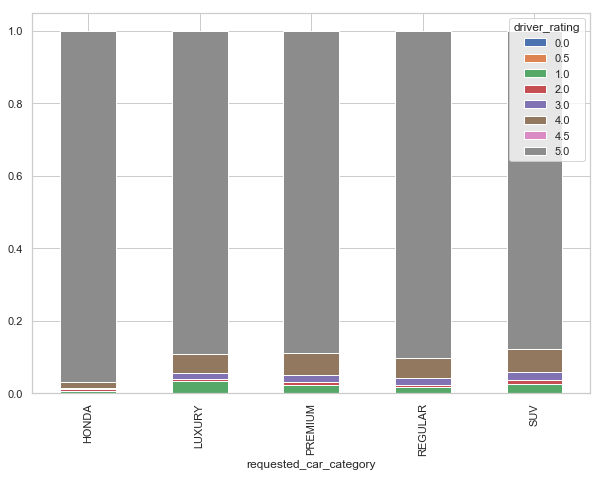

In [524]:
pivot_df2.plot.bar(stacked=True,  figsize=(10,7))

In [287]:
df['requested_car_category'].value_counts()

REGULAR    765282
SUV         28663
PREMIUM      7503
LUXURY       2090
HONDA        1355
Name: requested_car_category, dtype: int64

In [483]:
for x in ['requested_car_category','charity_id','surge_factor','color','model','year','make','Fog','HeavyFog','Thunder']:
    print(x)

requested_car_category
charity_id
surge_factor
color
model
year
make
Fog
HeavyFog
Thunder


In [476]:
def stacked_barchart(dimension):
    df_test = df.groupby([dimension,'driver_rating']).size().reset_index()
    df_test.columns = [*df_test.columns[:-1], 'Count']
    pivot_df = df_test.pivot(index=dimension, columns='driver_rating', values='Count')
    pivot_df = pivot_df.fillna(0)
    pivot_df2 = pivot_df.div(pivot_df.sum(axis=1), axis=0)
    pivot_df2.plot.bar(stacked=True,  figsize=(10,7))
    return pivot_df2

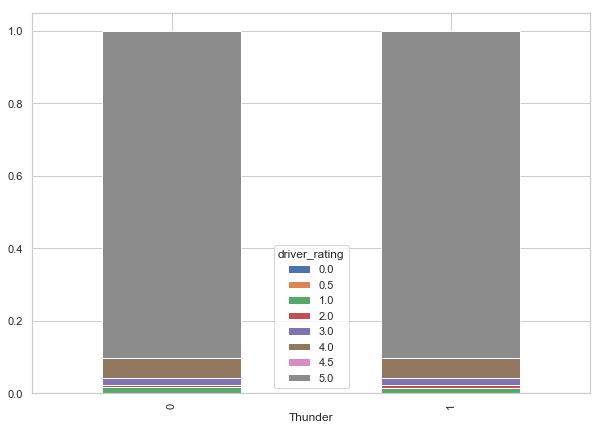

In [481]:
df3 = stacked_barchart('Thunder')

In [482]:
df3.head()

driver_rating,0.0,0.5,1.0,2.0,3.0,4.0,4.5,5.0
Thunder,,,,,,,,
0,0.000060,0.000001,0.016940,0.005918,0.019935,0.054488,0.000014,0.902644
1,0.000015,0.000000,0.015585,0.006411,0.019040,0.056063,0.000000,0.902886


In [328]:
pivot_df2.head()

driver_rating,0.0,0.5,1.0,2.0,3.0,4.0,4.5,5.0
requested_car_category,,,,,,,,
HONDA,0.000000,0.000000,0.006642,0.003690,0.002952,0.016974,0.000000,0.969742
LUXURY,0.000000,0.000000,0.034450,0.004306,0.016746,0.053589,0.000000,0.890909
PREMIUM,0.000000,0.000000,0.023724,0.006797,0.018393,0.060776,0.000000,0.890311
REGULAR,0.000059,0.000001,0.016365,0.005857,0.019776,0.054356,0.000013,0.903573
SUV,0.000000,0.000000,0.026515,0.008722,0.023515,0.061927,0.000000,0.879322


In [360]:
df['make'].value_counts().index.tolist()[:10]

['Toyota',
 'Honda',
 'Nissan',
 'Hyundai',
 'Ford',
 'Kia',
 'Chevrolet',
 'Dodge',
 'Mazda',
 'Volkswagen']

In [373]:
df4 = df[df['charity_id'].isin(df['charity_id'].value_counts().index.tolist()[:10])]

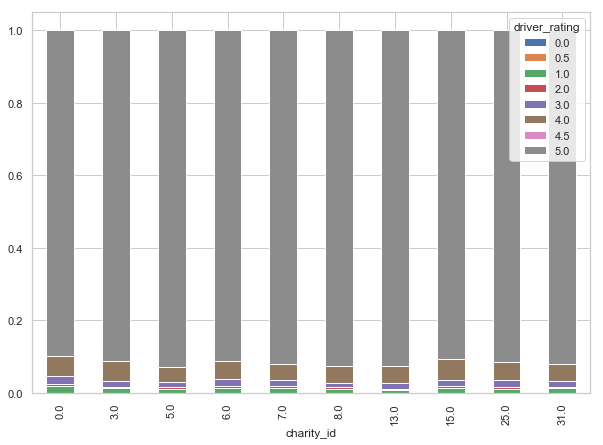

In [374]:
df_test = df4.groupby(['charity_id','driver_rating']).size().reset_index()
df_test.columns = [*df_test.columns[:-1], 'Count']
pivot_df = df_test.pivot(index='charity_id', columns='driver_rating', values='Count')
pivot_df = pivot_df.fillna(0)
pivot_df2 = pivot_df.div(pivot_df.sum(axis=1), axis=0)
pivot_df2.plot.bar(stacked=True,  figsize=(10,7))